# Rainier Demo

In [1]:
!pip install matplotlib-scalebar

In [2]:
import numpy as np
import pandas as pd
import geopandas as gpd
import rasterio as rio
import pystac
import pystac_client
import stackstac
import matplotlib.pyplot as plt
import xarray as xr
from datetime import datetime
import matplotlib
import ipyleaflet
import sys
import os
import dask_gateway
import dask
import planetary_computer
from rechunker import rechunk
sys.path.append('../sar_snowmelt_timing')
import s1_rtc_bs_utils
import contextily as ctx
import rioxarray as rxr
import skimage
import glob
from matplotlib_scalebar.scalebar import ScaleBar
import matplotlib.transforms as mtransforms
import re
import scipy

In [3]:
cluster = dask_gateway.GatewayCluster(shutdown_on_close=False)
client = cluster.get_client()
cluster.adapt(minimum=10, maximum=100)
print(client.dashboard_link)

https://pccompute.westeurope.cloudapp.azure.com/compute/services/dask-gateway/clusters/prod.0133a443f59c4542bf745536b9e6320c/status


In [4]:
bbox_gdf = gpd.read_file('../input/shapefiles/mt_rainier.geojson')

In [5]:
years = [2015,2016,2017,2018,2019,2020,2021,2022]

In [6]:
res = 10

In [7]:
ts_ds = s1_rtc_bs_utils.get_s1_rtc_stac_pc(bbox_gdf,start_time='2014-01-01',end_time=datetime.today().strftime('%Y-%m-%d'),polarization='all',resolution=res)

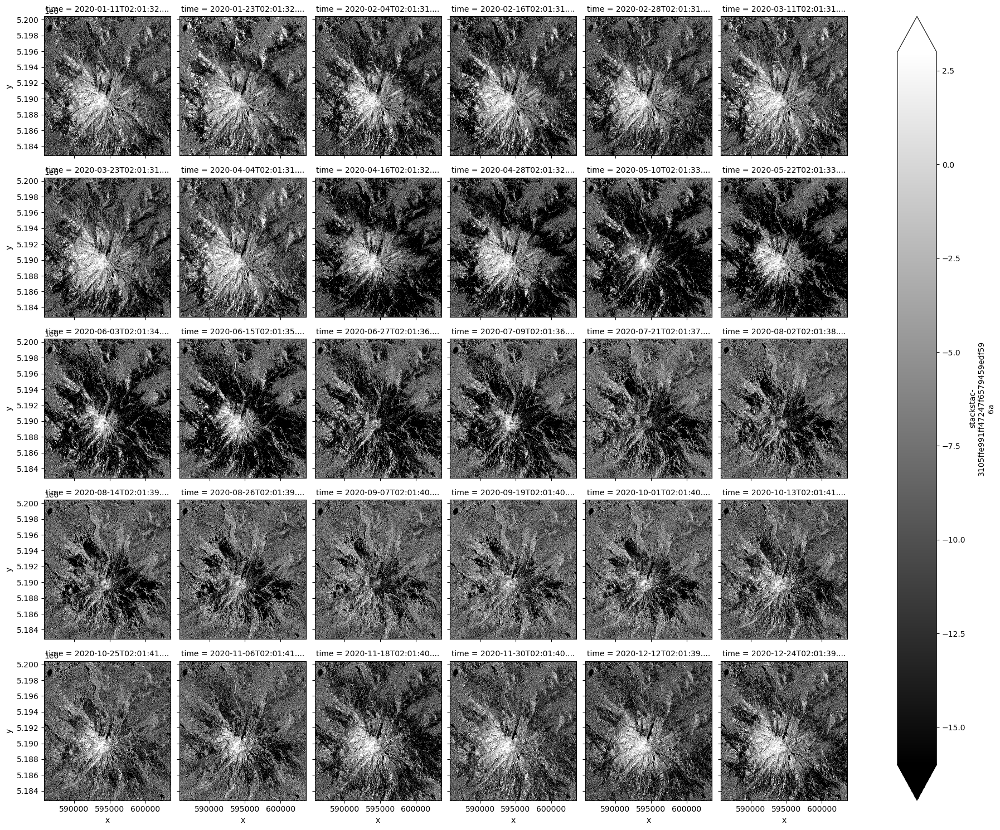

In [8]:
ts_ds_viz = 10*np.log10(ts_ds.sel(band='vv').sel(time=slice('2020-01-01','2020-12-31')))
ts_ds_viz[ts_ds_viz['sat:relative_orbit']==137].plot(col='time',col_wrap=6,cmap='gray',vmin=-16,vmax=3)

In [9]:
rainier_glaciers = gpd.read_file('../input/shapefiles/rainier_glaciers.geojson').to_crs(ts_ds.crs)

In [10]:
ts_ds_clipped = ts_ds.rio.clip(rainier_glaciers.geometry,rainier_glaciers.crs)

In [11]:
for year in years:
    print(f'Processing {year}...')
    melt_year = slice(f'{year}-02-01',f'{year}-07-31')
    
    if (year == 2015) | (year == 2016):
        ts_ds_oneyear = ts_ds_clipped.sel(time=melt_year).sel(band='vv') 
    else:
        ts_ds_oneyear = ts_ds_clipped.sel(time=melt_year) 
        
    runoffs_median = s1_rtc_bs_utils.get_runoff_onset(ts_ds_oneyear,num_acquisitions_during_melt_season=6)
    runoffs_median_computed = runoffs_median.compute()
    
    runoffs_median_computed.dt.dayofyear.rio.to_raster(f'../output/cascades/MtRainier/runoff_onset_{year}_median_{res}m.tif')

Processing 2015...
Processing 2016...
Processing 2017...
Processing 2018...
Processing 2019...
Processing 2020...
Processing 2021...
Processing 2022...


In [12]:
geotiff_list = glob.glob(f'../output/cascades/MtRainier/runoff_onset_2*_median_{res}m.tif')

year_list = []
for geotiff in geotiff_list:
    year_list.append(re.search("([0-9]{4})", geotiff).group(0))
year_list = [int(year) for year in year_list]

 #Create variable used for time axis
time_var = xr.Variable('time', year_list)

# Load in and concatenate all individual GeoTIFFs
runoffs_allyears = xr.concat([rxr.open_rasterio(i) for i in geotiff_list],dim=time_var).squeeze().sortby('time')

#runoffs_allyears.plot(col='time')
runoffs_allyears_median = runoffs_allyears.median(dim='time')
runoffs_allyears_std = runoffs_allyears.std(dim='time')
polyfits= runoffs_allyears.polyfit('time',deg=1,full=True,cov=True)
runoffs_allyears_corr = polyfits.polyfit_coefficients[0].rio.set_crs(runoffs_allyears.rio.crs)
runoffs_allyears_corr_strength = xr.corr(runoffs_allyears.time,runoffs_allyears,dim='time').rio.set_crs(runoffs_allyears.rio.crs)

In [13]:
runoffs_allyears_median.rio.to_raster(f'../output/cascades/MtRainier/runoff_onset_allyears_median_{res}m.tif')

/tmp/ipykernel_1447/3734056180.py:5: UserWarning: FixedFormatter should only be used together with FixedLocator
  im.cbar.ax.set_yticklabels(s.dt.strftime(date_format='%B %d'))


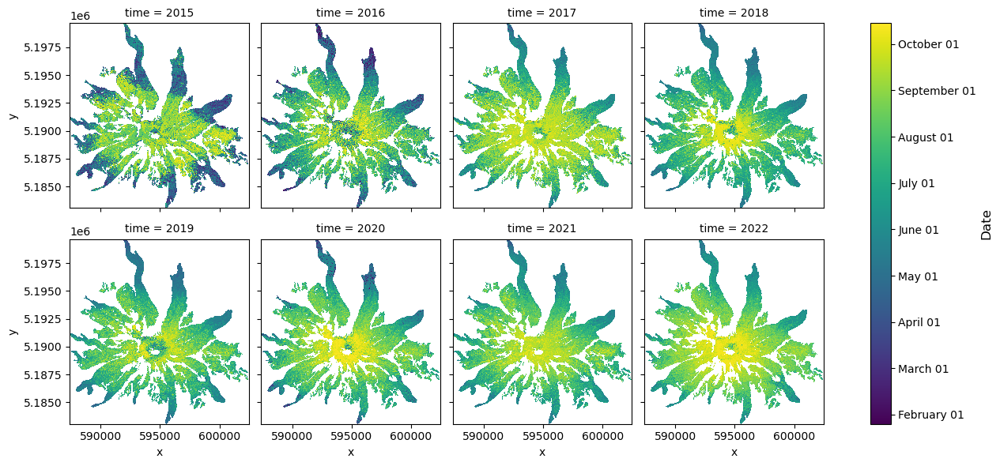

In [14]:
im = runoffs_allyears.plot(col='time',col_wrap=4)

s = pd.Series(pd.date_range("2020-1-1", periods=12, freq=pd.offsets.MonthBegin(1)))

im.cbar.ax.set_yticklabels(s.dt.strftime(date_format='%B %d'))
im.cbar.set_label(label='Date',size='large') 

Text(0.5, 1.0, '2015-2022 median snowmelt runoff')

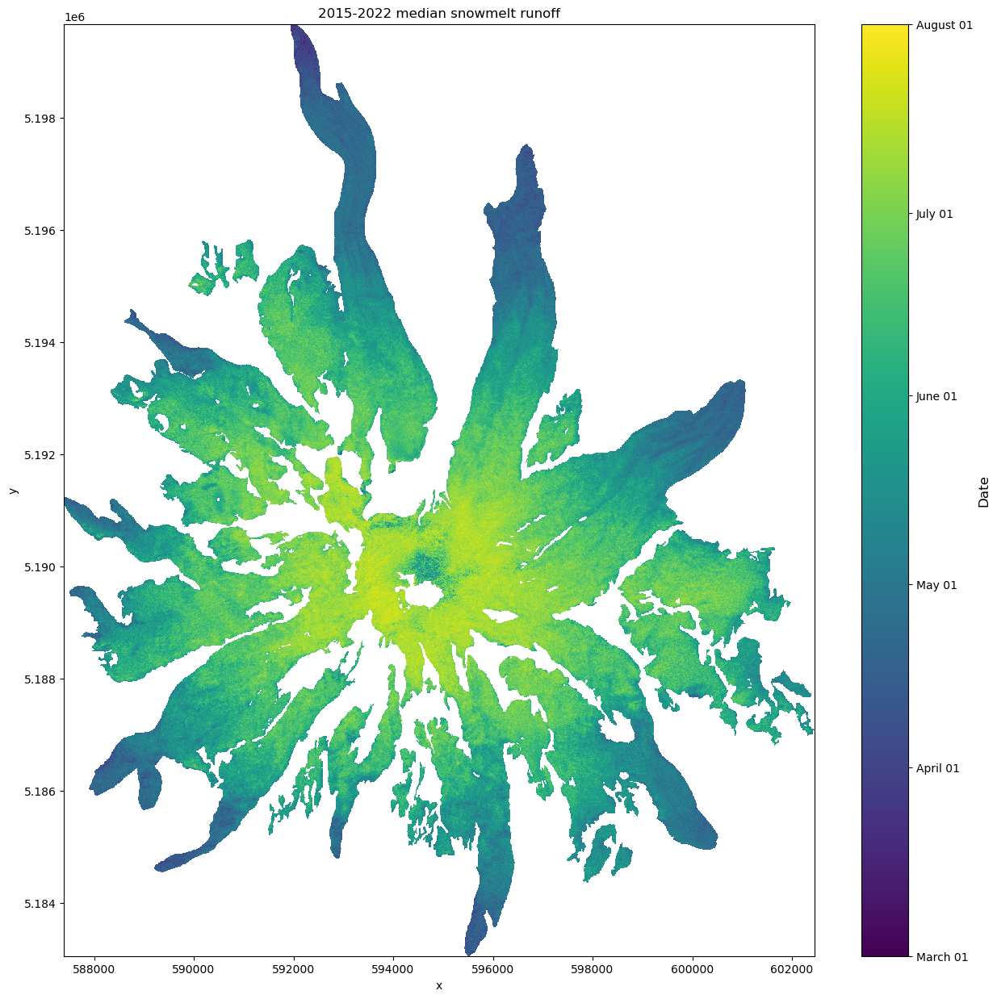

In [15]:
f,ax=plt.subplots(figsize=(15,15))
im = runoffs_allyears_median.plot(ax=ax,vmin=61,vmax=214,add_colorbar=False)

s = pd.Series(pd.date_range("2020-1-1", periods=12, freq=pd.offsets.MonthBegin(1)))

cb = plt.colorbar(im,ticks=s.dt.dayofyear)
cb.ax.set_yticklabels(s.dt.strftime(date_format='%B %d'))
cb.set_label(label='Date',size='large') 

ax.set_title('2015-2022 median snowmelt runoff',size='large')

Text(0.5, 1.0, '2015-2022 snowmelt runoff standard deviation')

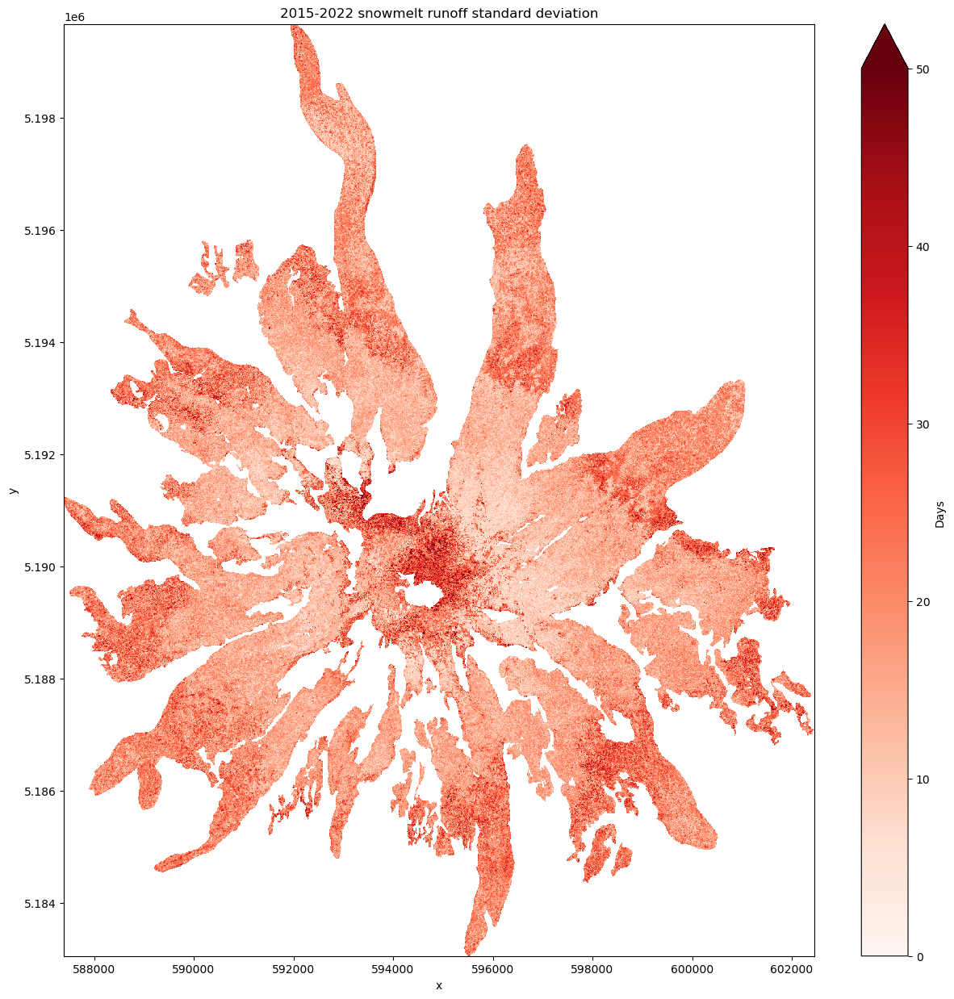

In [16]:
f,ax=plt.subplots(figsize=(15,15))
runoffs_allyears_std.plot(ax=ax,vmin=0,vmax=50,col_wrap=4,cmap='Reds',cbar_kwargs={'label':'Days'})

ax.set_title('2015-2022 snowmelt runoff standard deviation',size='large')

In [17]:
deviations = runoffs_allyears-runoffs_allyears_median

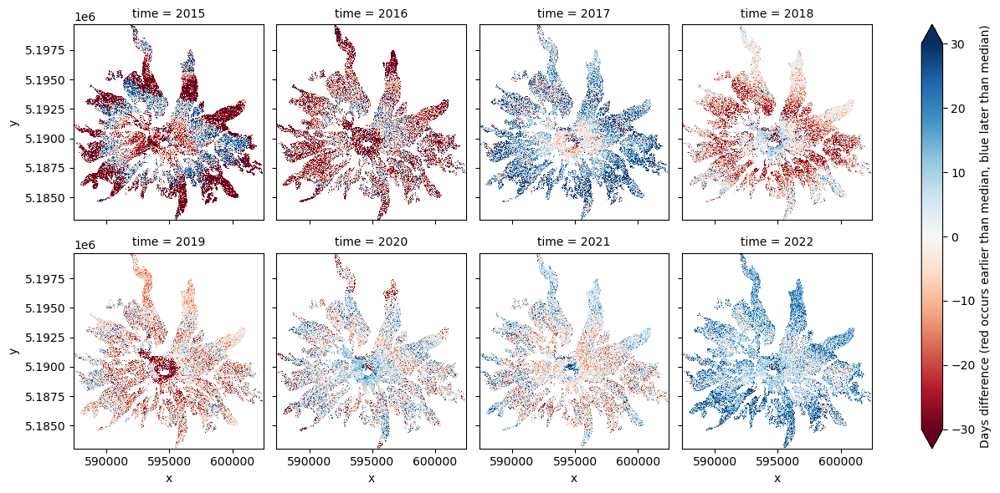

In [18]:
deviations.plot(col='time',vmin=-30,vmax=30,cmap='RdBu',col_wrap=4,cbar_kwargs={'label':'Days difference (red occurs earlier than median, blue later than median)'})

In [19]:
nm = 'MtRainier'
filename_median = glob.glob(f'../output/cascades/{nm}/runoff_onset_allyears_median*.tif')
median_runoff = rxr.open_rasterio(filename_median[0]).squeeze()
#median_runoff = median_runoff.where(runoffs_allyears_std<20) #hmmm

filename_dem = glob.glob(f'../output/cascades/{nm}/*dem*.tif')
dem = rxr.open_rasterio(filename_dem[0]).squeeze().where(median_runoff>-1)

filename_aspect = glob.glob(f'../output/cascades/{nm}/*aspect*.tif')
aspect = rxr.open_rasterio(filename_aspect[0]).squeeze().where(median_runoff>-1)

filename_slope = glob.glob(f'../output/cascades/{nm}/*slope*.tif')
slope = rxr.open_rasterio(filename_slope[0]).squeeze().where(median_runoff>-1)

stats_df = pd.DataFrame(columns=['runoff_dates','elevation','aspect','slope'])
stats_df['runoff_dates'] = median_runoff.data.reshape(-1)
stats_df['elevation'] = dem.data.reshape(-1)
stats_df['aspect'] = np.cos(np.deg2rad(aspect.data.reshape(-1)))
stats_df['slope'] = slope.data.reshape(-1)
stats_df['dah'] = np.cos(np.deg2rad(202.5)-np.deg2rad(aspect.data.reshape(-1)))*np.arctan(np.deg2rad(slope.data.reshape(-1)))
stats_df = stats_df.dropna()

predictors = np.append(np.ones_like([stats_df['runoff_dates']]).T,stats_df.loc[:,['elevation']].to_numpy(),axis=1)
B,_,_,_ = scipy.linalg.lstsq(predictors, stats_df.loc[:,'runoff_dates'])
print(f'For {nm} during 2015-2022, the average runoff onset date is predicted {B[1]*100:.2f} days later for every 100m of elevation gain.')
print(stats_df.corr())
print(f'---------------------------------------------------------------------------------------------------------------------------')

For MtRainier during 2015-2022, the average runoff onset date is predicted 3.39 days later for every 100m of elevation gain.
              runoff_dates  elevation    aspect     slope       dah
runoff_dates      1.000000   0.850167 -0.006649  0.261391 -0.061479
elevation         0.850167   1.000000 -0.118174  0.374210  0.041414
aspect           -0.006649  -0.118174  1.000000 -0.016318 -0.857279
slope             0.261391   0.374210 -0.016318  1.000000 -0.069760
dah              -0.061479   0.041414 -0.857279 -0.069760  1.000000
---------------------------------------------------------------------------------------------------------------------------


In [20]:
f'For the 2015-2022 median runoff onset date, {100*stats_df.corr()["runoff_dates"]["elevation"]**2:.2f}% of the varaince in runoff onset date can be explained by elevation alone.'

'For the 2015-2022 median runoff onset date, 72.28% of the varaince in runoff onset date can be explained by elevation alone.'

## Linear regression just on elevation

In [21]:
prediction = B[1]*dem+B[0]
residual = median_runoff - prediction

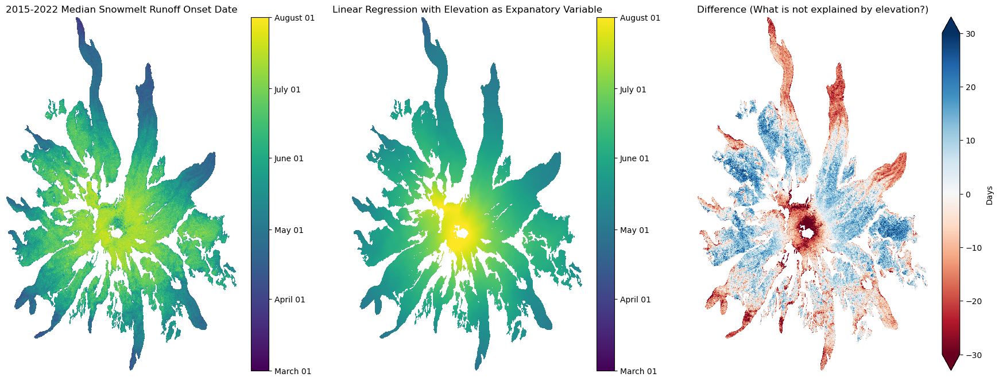

In [22]:
f,ax=plt.subplots(1,3,figsize=(22,8))
im1 = runoffs_allyears_median.plot(ax=ax[0],vmin=61,vmax=214, add_colorbar=False)
im2 = prediction.plot(ax=ax[1],vmin=61,vmax=214, add_colorbar=False)
residual.plot(ax=ax[2],vmin=-30,vmax=30,cmap='RdBu',cbar_kwargs={'label':'Days'})
ax[0].set_title('2015-2022 Median Snowmelt Runoff Onset Date')
ax[1].set_title('Linear Regression with Elevation as Expanatory Variable')
ax[2].set_title('Difference (What is not explained by elevation?)')

cb = plt.colorbar(im1,ax=ax[0],ticks=s.dt.dayofyear)
cb.ax.set_yticklabels(s.dt.strftime(date_format='%B %d'))

cb = plt.colorbar(im2,ax=ax[1],ticks=s.dt.dayofyear)
cb.ax.set_yticklabels(s.dt.strftime(date_format='%B %d'))

for axs in ax:
    axs.axis('off')
    